In [1]:
print("hello")

hello


In [2]:
import pandas as pd
import matplotlib.pyplot as plt



#headers = ['Name', 'Age', 'Marks']

df = pd.read_csv('samples-folder/samples2.csv')



df=df.drop(0)
df=df.drop(1)
# print(df)

if(len(df.columns) == 3):
    df.columns = ['sample interval', 'signal', 'filtered']
    # print(df)

    list1 = df.filtered
    list2 = df.signal
# print(list1)

else:
    df.columns = ['sample interval', 'signal']
    list1 = df.signal

plotting1 = []
plotting2 = []
for i in list1:
    plotting1.append(float(i))

# for i in list2:
#     plotting2.append(float(i))

# print(type(plotting[0]))


# print(plotting)
# print(len(plotting))

length_df = len(df)

x = []
for i in range(1,length_df+1):
    x.append(i)
    
plt.figure(figsize=(300,70))

# plt.plot(x, plotting2, label ="Original ECG signal") 
# plt.show()   


plt.figure(figsize=(300,70))
plt.plot(x[:], plotting1[:], label ="Filtered ECG signal")
plt.show()

# plt.figure(figsize=(400,50))
# plt.subplot(1,2,1)
# plt.plot(x, plotting1)
# plt.subplot(1,2,2)
# plt.plot(x, plotting2)


# df.set_index('Marks').plot()

# plt.show()

haar = []

count = 28
flag = 1

i = 1
while(i<= length_df):
    j = i
    
#     if(i == 10000-count+1):
#         for k in range(1, count):
#             haar.append(-1)
#         break
    
    while(i<= length_df and i < j + count):
        
        haar.append(1)
        i+=1
            
            
    while(i<= length_df and i< j + (2*count)):
        haar.append(-1)
        i+=1
        
    
    
    flag = - flag 
    
    

    
# print(haar)
# print(len(haar))
plt.figure(figsize=(200,50))
plt.plot(x, plotting1, label ="ecg signal")
plt.plot(x, haar, label ="haar")
plt.show()


    
    


# In[44]:



# now dot product  



<Figure size 30000x7000 with 0 Axes>

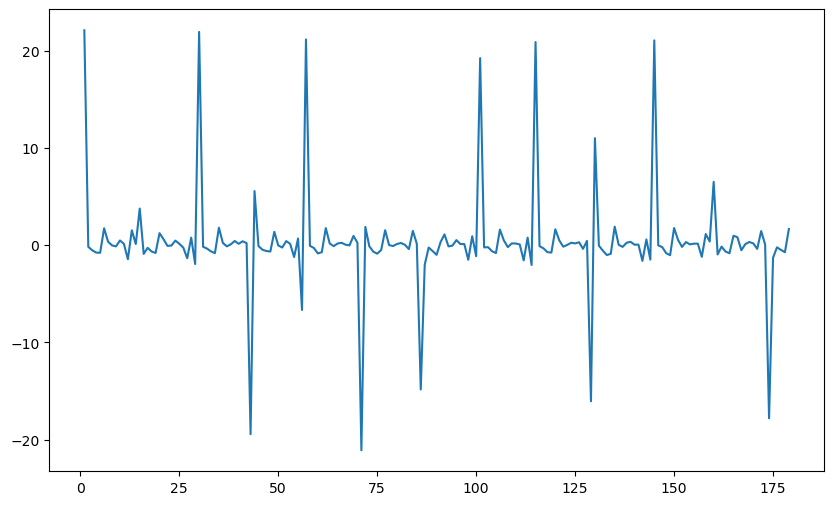

In [3]:
list_peaks = []
i = 0
while(i< length_df):
    sum1 = 0
    j = i
    while(i< length_df and i < j+ count):
        sum1 += plotting1[i]
        i+=1
    while(i< length_df and i< j + (2* count)):
        sum1 -= plotting1[i]
        i+=1
        
    list_peaks.append(sum1)
    sum1 = 0


# print(list_peaks)

# print(len(list_peaks))
base = []
for i in range(0, len(list_peaks)):
    base.append(i+1)
    
plt.figure(figsize=(10,6))
plt.plot(base, list_peaks)
    


list_peaks_stuffed = []

index = 0

# def compute():
#     global index
#     list_peaks_stuffed = []
#     for i in range(len(list_peaks)-1):
#         j = i
#         while(i< j+ count):
#             list_peaks_stuffed.append(0)
#             i+=1
#         if(index < len(list_peaks)):
#             list_peaks_stuffed.append(list_peaks[index])
#             index +=1

#         while(i< j+ (2* count) - 1):
#             list_peaks_stuffed.append(0)
#             i+=1

#         i = j
#     return list_peaks_stuffed[0]

# list_new = []
# for k in range(0, 10000):
#     val = compute()
    
    
    
    
# left = 10000 - len(list_peaks_stuffed) -1

# for i in range(0, left//2):
#     list_peaks_stuffed.append(0)

# list_peaks_stuffed.append(list_peaks[len(list_peaks) -1])

# for j in range(0, left//2):
#     list_peaks_stuffed.append(0)
    
# to_be_popped = len(list_peaks_stuffed) - 10000
# for i in range(to_be_popped):
#     list_peaks_stuffed.pop()
    
    
        

# # print(len(list_peaks_stuffed))
# print(list_peaks_stuffed)
# # plt.subplot(1,2,2)
# plt.figure(figsize=(10,6))
# plt.plot(x, list_peaks_stuffed)
# plt.show()

In [4]:
# print(plotting1)

In [5]:
import math

length = len(plotting1) -1
left_len = length

pointer = 0
remaining_len = length+1

x = []
for i in range(length+1):
    x.append(i+1)

iter_count = 1
arr = []
fig, ax = plt.subplots(1, 1, figsize=(60, 20))
# ax[0].plot(x, plotting1)
# ax[0].set_title("Original")
while(iter_count<=1 ):
    arr = arr[left_len+1:]
    arr3 = []
    arr_d = []
    for k in range(0, length+1):
        arr_d.append(0)
    
    for k in range(0, length+1):
        arr3.append(0)
    
    arr2 = []
    pointer1 = pointer
    count = 0
    while(pointer1 < left_len ):
        arr2.append((plotting1[pointer1] + plotting1[pointer1 + 1])/ math.sqrt(2))
        pointer1 +=2
        count += 1
    
    
    
    pointer2 = pointer
    while(pointer2 < left_len):
        arr2.append((plotting1[pointer2] - plotting1[pointer2+ 1] )/ math.sqrt(2))
        pointer2 += 2
        
    if((left_len + 1)%2 == 1):
        arr2.append(plotting1[length])
    
#     if(iter_count >= 1 and iter_count <= 10):
    
    for g in range(0, len(arr2)):
        if(2*g <= length):
            arr3[2*g] = arr2[g]
    
    
    for g in range(count, len(arr2)):
        if(2*(g - count) <= length):
            arr_d[2*(g- count)] = arr2[g]
            
    for g in range(0, length+1):
        if(arr3[g] == 0):
            if((g-1) <= length and (g+1) <= length):
                arr3[g] = (arr3[g-1] + arr3[g+1])/2
                
    for g in range(0, length+1):
        if(arr_d[g] == 0):
            if((g-1) <= length and (g+1) <= length):
                arr_d[g] = (arr_d[g-1] + arr_d[g+1])/2
            
    arr = arr2 + arr
    
    
    
    ax.plot(x, arr3)
    ax.plot(x, arr_d)
    ax.plot(x, plotting1)
    
#     ax[iter_count -1].set_title(f"Iteration{iter_count}")
#     print("Hello world")
        

    iter_count +=1
    left_len = ((left_len + 1)//2)-1
    remaining_len = length - left_len
    

9999
0


Text(0.5, 1.0, 'Segmented signal')

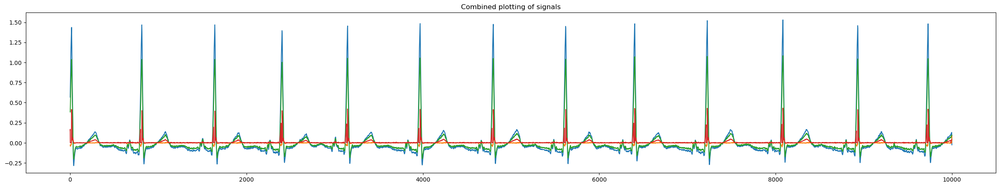

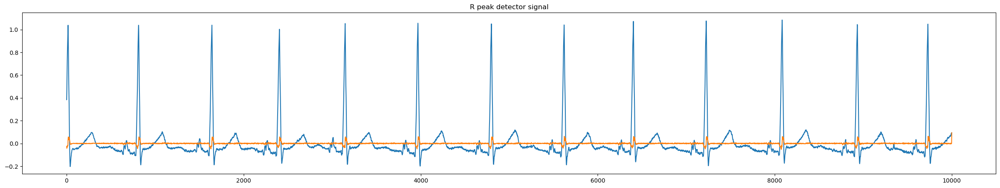

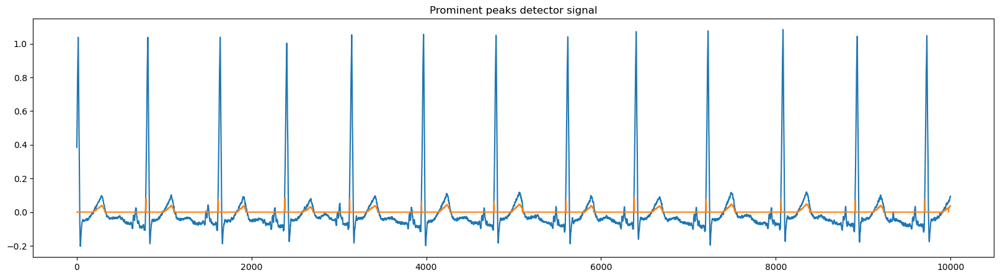

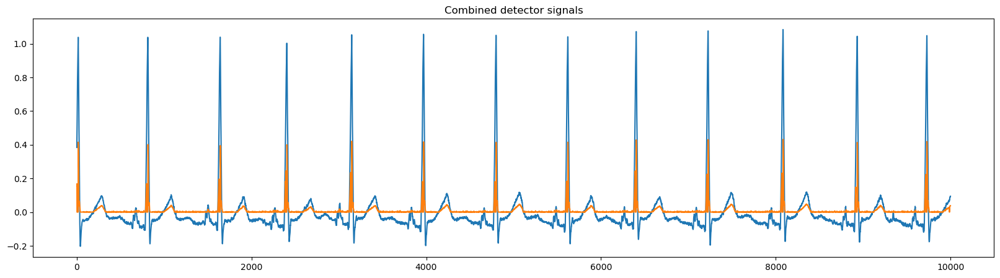

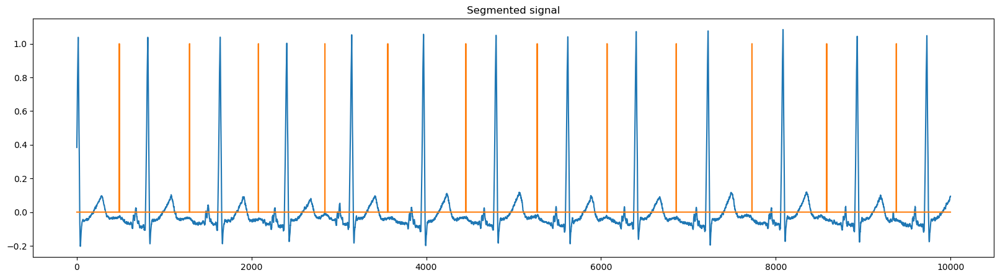

In [6]:

import math

length = len(plotting1) -1
left_len = length

pointer = 0
remaining_len = length+1

x = []
for i in range(length+1):
    x.append(i+1)

iter_count = 1
arr = []
fig_, ax_ = plt.subplots(1, 1, figsize=(30, 5))
# ax[0].plot(x, plotting1)

arr = arr[left_len+1:]
arr3 = []
arr_d = []
for k in range(0, length+1):
    arr_d.append(0)

for k in range(0, length+1):
    arr3.append(0)

arr2 = []
pointer1 = pointer
count = 0
while(pointer1 < left_len ):
    arr2.append((plotting1[pointer1] + plotting1[pointer1 + 1])/ math.sqrt(2))
    pointer1 +=2
    count += 1



pointer2 = pointer
while(pointer2 < left_len):
    arr2.append((plotting1[pointer2] - plotting1[pointer2+ 1] )/ math.sqrt(2))
    pointer2 += 2

if((left_len + 1)%2 == 1):
    arr2.append(plotting1[length])

#     if(iter_count >= 1 and iter_count <= 10):


print(len(arr2))
print(len(arr))
for g in range(0, len(arr2)):
    if(2*g <= length):
        arr3[2*g] = arr2[g]


for g in range(count, len(arr2)):
    if(2*(g - count) <= length):
        arr_d[2*(g- count)] = arr2[g]

for g in range(0, length+1):
    if(arr3[g] == 0):
        if((g-1) <= length and (g+1) <= length):
            arr3[g] = (arr3[g-1] + arr3[g+1])/2

for g in range(0, length+1):
    if(arr_d[g] == 0):
        if((g-1) <= length and (g+1) <= length):
            arr_d[g] = (arr_d[g-1] + arr_d[g+1])/2

arr = arr2 + arr



ax_.plot(x, arr3)
ax_.plot(x, arr_d)
ax_.plot(x, plotting1)

ax_.set_title("Combined plotting of signals")

# print(len(arr_d), len(plotting1))


arr_t_wave = []
for samp in range(0, length_df):
    if(samp+20 < length_df-1):
        if(arr_d[samp + 20]- arr_d[samp] >= 0.015):
            arr_t_wave.append(0)
        elif(plotting1[samp+20] - arr_d[samp] < -0.015):
            arr_t_wave.append(0)   
        else:
        
            arr_t_wave.append((plotting1[samp]))
    else:
        arr_t_wave.append(plotting1[samp])
        
    if(arr_t_wave[samp] <= 0):
        arr_t_wave[samp] = 0
    else:
        arr_t_wave[samp] = (arr_t_wave[samp]) * 0.4
        
        
        

#Removing R peaks from arr_t_wave:
arr_t_wave2 = []
for samp in range(0, length_df):
    if(samp+10 < length_df-1):
        if(arr_d[samp + 10]- arr_d[samp] >= 0.015):
            arr_t_wave2.append(arr_d[samp]* 3)
        elif(plotting1[samp+10] - arr_d[samp] < -0.015):
            arr_t_wave2.append(arr_d[samp]* 3)   
        else:
        
            arr_t_wave2.append((plotting1[samp]))
    else:
        arr_t_wave2.append(plotting1[samp])
        
    if(arr_t_wave2[samp] <= 0):
        arr_t_wave2[samp] = 0
    else:
        arr_t_wave2[samp] = (arr_t_wave2[samp]) * 0.4
        
#     if( samp+ 10 < 9989 and (arr_d[samp] >= 0.15 or arr_d[samp + 10] >= 0.15)):
#         samp1 = samp -1000
#         while samp1 <= samp:
#             arr_t_wave[samp1] = 0
#             samp1 += 1
#         while samp1 <= samp+ 5:
#             arr_t_wave.append(0)
#             samp1 += 1
        
#         samp +=5
    

#         else:
#             arr_t_wave[samp] = 0
        
    
        


        
ax_.plot(arr_t_wave2)
dict1 = {}

marker_list = []

s = 0
limit = 200
while(s <= length_df):
    t = s+1
    flag = 0
    while(t< length_df and t <= s + limit and arr_t_wave2[t] <= 0.008 and arr_t_wave2[t] >= -0.008):
        flag += 1
        t += 1
    if(flag == limit):
        flag = 0
        st = s
        s = s+ limit
        while(s< length_df and arr_t_wave2[s] <= 0.008 and arr_t_wave2[s] >= -0.008):
            s += 1
        dict1[st] = s
        marker_list.append(st)
        marker_list.append(s-30)
    else:
        s = s + 1
        

for i in marker_list:
    if marker_list.count(i + 30) >= 1:
        marker_list = list(filter(lambda x: x != i and x != i+ 30, marker_list))

marker_list_f = []

p = 0
while(p < len(marker_list)-1):
    val = (marker_list[p] + marker_list[p+1])//2
    marker_list_f.append(val)
    p += 2

    

marker_signal = []

for i in range(0, length_df):
    if i in marker_list:
        marker_signal.append(1)
    else:
        marker_signal.append(0)
        
marker_signal_f = []

for i in range(0, length_df):
    if i in marker_list_f:
        marker_signal_f.append(1)
    else:
        marker_signal_f.append(0)
               
    
# print(marker_list)
# print(marker_list_f)
# print(dict1)
fig1, ax1 = plt.subplots(1, 1, figsize=(30, 5))

# ax1[iter_count -1].plot(x, plotting1)
ax1.plot(x, plotting1)
ax1.plot(x, arr_d)

ax1.set_title("R peak detector signal")

fig4, ax4 = plt.subplots(1, 1, figsize=(20, 5))

# ax1[iter_count -1].plot(x, plotting1)
ax4.plot(x, plotting1)
ax4.plot(x, arr_t_wave)
ax4.set_title("Prominent peaks detector signal")

fig3, ax3 = plt.subplots(1, 1, figsize=(20, 5))

# ax1[iter_count -1].plot(x, plotting1)
ax3.plot(x, plotting1)
ax3.plot(x, arr_t_wave2)
ax3.set_title("Combined detector signals")



# fig5, ax5 = plt.subplots(1, 1, figsize=(20, 5))

# # ax1[iter_count -1].plot(x, plotting1)
# ax5.plot(x[1200: 2500], plotting1[1200: 2500])
# ax5.plot(x[1200: 2500], arr_t_wave2[1200: 2500])
# ax5.plot(x[1200: 2500], marker_signal[1200: 2500])



fig6, ax6 = plt.subplots(1, 1, figsize=(20, 5))

# ax1[iter_count -1].plot(x, plotting1)
ax6.plot(x, plotting1)
ax6.plot(x, marker_signal_f)
ax6.set_title("Segmented signal")


# fig2, ax2 = plt.subplots(1, 1, figsize=(60, 15))
# x1 = []
# plotting2 = []
# arr_d1 = []
# for i in range(700, 1200):
#     x1.append(i+1)
#     plotting2.append(plotting1[i])
#     arr_d1.append(arr_d[i])

# arr_t_wave = []
# for samp in range(700, 1200):
#     if(samp+10 < 1200):
#         if(arr_d[samp + 15]- arr_d[samp] >= 0.015):
#             arr_t_wave.append(0)
#         elif(plotting1[samp+15] - arr_d[samp] < -0.015):
#             arr_t_wave.append(0)   
#         else:
#             arr_t_wave.append((plotting1[samp]))
#     else:
#         arr_t_wave.append(plotting1[samp])
        
#     if(arr_t_wave[samp-700] <= 0):
#         arr_t_wave[samp-700] = 0
#     else:
#         arr_t_wave[samp-700] = (arr_t_wave[samp-700]* arr_t_wave[samp-700]) 
    
# # ax1[iter_count -1].plot(x, plotting1)
# ax2.plot(x1, plotting2)
# ax2.plot(x1, arr_d1)

# fig4, ax4 = plt.subplots(1, 1, figsize=(60, 15))
# ax4.plot(x1, plotting2)
# ax4.plot(x1, arr_t_wave)
    

[0, 486, 1290, 2078, 2839, 3559, 4452, 5269, 6069, 6860, 7727, 8582, 9379, 9998]


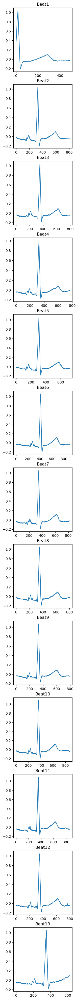

In [7]:
marker_list_f.insert(0, 0)
marker_list_f.append(length_df -1)

print(marker_list_f)
i = 0
fig8, ax8 = plt.subplots(len(marker_list_f) -1, 1, figsize=(3, 50))


while(i < len(marker_list_f)-1):
    beat = []
    for j in range(marker_list_f[i], marker_list_f[i+1] + 1):
        beat.append(plotting1[j])
    x = []
    for k in range(len(beat)):
        x.append(k + 1)
    ax8[i].plot(x, beat)
    ax8[i].set_title(f"Beat{i+1}")
    
    i += 1
        
    